In [1]:
from datetime import datetime

import natsort

from scipy.stats import mannwhitneyu, wilcoxon
from VD_A import VD_A
import itertools

import pandas as pd
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import holoviews as hv

import hvplot.pandas  # noqa
hvplot.extension('bokeh')  # This call loads the Matplotlib (the active one) and Plotly extensions.

import panel as pn

from pathlib import Path
import itertools
import functools
import re

In [2]:
paper_base = Path("~/Dropbox/Apps/Overleaf/kNN-Averaging @ Applied Soft Computing 2022").expanduser()
paper_tables = paper_base / "generated/tables"
paper_tables.mkdir(parents=True, exist_ok=True)
assert paper_tables.exists()
paper_figures = paper_base / "generated/figures"
paper_figures.mkdir(parents=True, exist_ok=True)
assert paper_figures.exists()

In [3]:
denoiser_to_latex = {
    "Noisy": r'$\mathtt{B}$',
    "R5": r'$\mathtt{Rep}_{5}$',
    "R10": r'$\mathtt{Rep}_{10}$',
    "R50": r'$\mathtt{Rep}_{50}$',
    "R100": r'$\mathtt{Rep}_{100}$',
    "Rep5": r'$\mathtt{Rep}_{5}$',
    "Rep10": r'$\mathtt{Rep}_{10}$',
    "Rep50": r'$\mathtt{Rep}_{50}$',
    "Rep100": r'$\mathtt{Rep}_{100}$',

    "AccumulativeResampling": r'$\mathtt{EAR}$',
    "EAR": r"$\mathtt{EAR}$",
    "GPSS-mc2000": r'$\mathtt{GPSS}_{\text{2k}}$',
    "GPSS-mc4000": r'$\mathtt{GPSS}_{\text{4k}}$',
    
    'k5-MD0.1': r'$\mathtt{KNN}_{5}^{0.1}$',
    'k5-MD0.25': r'$\mathtt{KNN}_{5}^{0.25}$',
    'k5-MD0.5': r'$\mathtt{KNN}_{5}^{0.5}$',
    'k5-MD1': r'$\mathtt{KNN}_{5}^{1}$',
    'k10-MD0.1': r'$\mathtt{KNN}_{10}^{0.1}$',
    'k10-MD0.25': r'$\mathtt{KNN}_{10}^{0.25}$',
    'k10-MD0.5': r'$\mathtt{KNN}_{10}^{0.5}$',
    'k10-MD1': r'$\mathtt{KNN}_{10}^{1}$',
    'k20-MD0.1': r'$\mathtt{KNN}_{20}^{0.1}$',
    'k20-MD0.25': r'$\mathtt{KNN}_{20}^{0.25}$',
    'k20-MD0.5': r'$\mathtt{KNN}_{20}^{0.5}$',
    'k25-MD0.5': r'$\mathtt{KNN}_{25}^{0.5}$',
    'k20-MD1': r'$\mathtt{KNN}_{20}^{1}$',
    'k50-MD0.1': r'$\mathtt{KNN}_{50}^{0.1}$',
    'k50-MD0.25': r'$\mathtt{KNN}_{50}^{0.25}$',
    'k50-MD0.5': r'$\mathtt{KNN}_{50}^{0.5}$',
    'k50-MD1': r'$\mathtt{KNN}_{50}^{1}$',
    'k100-MD0.1': r'$\mathtt{KNN}_{100}^{0.1}$',
    'k100-MD0.25': r'$\mathtt{KNN}_{100}^{0.25}$',
    'k100-MD0.5': r'$\mathtt{KNN}_{100}^{0.5}$',
    'k100-MD1': r'$\mathtt{KNN}_{100}^{1}$',
    'k500-MD0.1': r'$\mathtt{KNN}_{500}^{0.1}$',
    'k500-MD0.25': r'$\mathtt{KNN}_{500}^{0.25}$',
    'k500-MD0.5': r'$\mathtt{KNN}_{500}^{0.5}$',
    'k500-MD1': r'$\mathtt{KNN}_{500}^{1}$',
    'k1000-MD0.5': r'$\mathtt{KNN}_{1000}^{0.5}$',
}

In [4]:
df = pd.read_pickle("casestudy-data.pkl")

In [5]:

def tex_adapt_table(table, col_fix=True):
    tex = table.to_latex()
    
    # centre columns
    if re.search(r"\{l+\}", tex):
        orig_cols = re.search(r"\{l+\}", tex).group(0)
        cols = orig_cols.replace("l", "c")
        tex = tex.replace(orig_cols, cols)
    if col_fix:
        if "cccccccccc" in tex:
            tex = tex.replace("cccccccccc", "c|ccc|ccc|ccc")
            
    
    # centre column group headlines
    tex = tex.replace("{l}", "{c}")
 
    tex = tex.replace("++++", f"\\cellcolor{{goodgreen!50}}\\textcolor{{goodgreen}}{{\\ding{{51}}\\ding{{51}}\\ding{{51}}}}")
    tex = tex.replace("+++", f"\\cellcolor{{goodgreen!30}}\\transparent{{0.75}}\\textcolor{{goodgreen}}{{\\ding{{51}}\\ding{{51}}}}")
    tex = tex.replace("++", f"\\cellcolor{{goodgreen!15}}\\transparent{{0.5}}\\textcolor{{goodgreen}}{{\\ding{{51}}}}")
    tex = tex.replace("+", f"\\transparent{{0.25}}\\textcolor{{goodgreen}}{{\\ding{{51}}}}")

    tex = tex.replace("=", f"\\textcolor{{gray}}{{\\ensuremath{{\\equiv}}}}")     

    tex = tex.replace("XXXX", f"\\cellcolor{{badred!50}}\\textcolor{{badred}}{{\\ding{{55}}\\ding{{55}}\\ding{{55}}}}")
    tex = tex.replace("XXX", f"\\cellcolor{{badred!30}}\\transparent{{0.75}}\\textcolor{{badred}}{{\\ding{{55}}\\ding{{55}}}}")
    tex = tex.replace("XX", f"\\cellcolor{{badred!15}}\\transparent{{0.5}}\\textcolor{{badred}}{{\\ding{{55}}}}")
    tex = tex.replace("X", f"\\transparent{{0.25}}\\textcolor{{badred}}{{\\ding{{55}}}}")

    # names
    tex = tex.replace("Noisy", f"\\baseline")
    tex = tex.replace("AccumulativeResampling", "\\EAR")
    tex = tex.replace("EAR", "\\EAR")
    tex = tex.replace("GPSS-mc2000", "\\GPSStwo")
    tex = tex.replace("GPSS-mc4000", "\\GPSSfour")
    
    tex = tex.replace(f"base\\_problem", "")
    
    # problem names
    tex = tex.replace("bnh", "BNH")
    tex = tex.replace("kursawe", "Kursawe")
    tex = tex.replace(f"OmniTest\_2", f"OmniTest$_2$")
    tex = tex.replace(f"OmniTest\_3", f"OmniTest$_3$")
    tex = tex.replace(f"OmniTest\_4", f"OmniTest$_4$")
    tex = tex.replace(f"OmniTest\_5", f"OmniTest$_5$")
    tex = tex.replace("osy", "OSY")
    tex = tex.replace("sympartrotated", "Sympart Rotated")
    tex = tex.replace("sympart", "Sympart")
    tex = tex.replace("tnk", "TNK")
    tex = tex.replace("truss2d", "Truss2D")
    tex = tex.replace("welded\\_beam", "Welded Beam")
    
    # colors
    tex = tex.replace("cellbetter", f"\\cellcolor{{goodgreen!30}}").replace("cellworse", f"\\cellcolor{{badred!30}}")
    # tex = tex.replace("cellyellow", f"\\cellcolor{{goodgreen!15}}")
    
    # 50% -> Median
    tex = tex.replace("50\\%", "median")
    
        # \repAppr{n}
    for n in [10, 100][::-1]:
        tex = tex.replace(f"Rep{n}", f"\\repAppr{{{n}}}")
        
        # \knnAvg{\selectedK}{\maxDist}

    for k in [5, 10, 20, 25, 50, 100, 500, 1000]:
        tex = tex.replace(f"k{k}-", f"\\knnAvg{{{k}}}")
        
    for md in [0.1, 0.25, 0.5, 1, 2]:
        tex = tex.replace(f"MD{md}", f"{{{md}}}")
        
    tex = tex.replace(f"perf\\_gigd", "\IGD").replace(f"perf\\_ghv", "\HV").replace(f"perf\\_df", "\meanErr")
    tex = tex.replace(f"perf\\_igd", "\IGD").replace(f"perf\\_hv", "\HV")
    
    return tex

def write_table_to_file(table, filepath, col_fix=True):
    tex = tex_adapt_table(table, col_fix=col_fix)
    with open(filepath, 'w') as texfile:
        texfile.write(tex)
    return tex

In [6]:
approach_columns = ["Rep10", "Rep100", "EAR"]
sort_cols = ["k", "resample", "MD"]
sort_list = ["k10-MD0.5","k25-MD0.5","k50-MD0.5","k100-MD0.5","k1000-MD0.5"]

effect_sizes = {"negligible": 1, "small":2, "medium": 3, "large": 4}
performance_indicators = ["perf_dfp", "perf_igd", "perf_hv"]  #, "timedelta", "time_per_gen"]

def mannwhitney_pi_table(means_dataframe, pis=performance_indicators, alpha_correct=192):
    approaches = means_dataframe.denoiser.unique()  # get a list of all approaches
    symbols_df = pd.DataFrame()  # the table we initialize
    for appA, appB in itertools.product(approaches, approach_columns):  # iterate over pairs of approaches

        appA_df = means_dataframe[means_dataframe.denoiser == appA].sort_values(["base_problem", "pop_size"])
        appB_df = means_dataframe[means_dataframe.denoiser == appB].sort_values(["base_problem", "pop_size"])
        assert len(appA_df) == len(appB_df), f"both dataframes have the same length, currently it's {appA}: {len(appA_df)} vs {appB}: {len(appB_df)}"
        assert (appA_df["pop_size"].astype('string')).tolist() == (appB_df["pop_size"].astype('string')).tolist(), "sorting of dataframes is the same"
                
        pi_symbols = []
        for pi in pis:
            vd = None
            if ((appA_df[pi].reset_index() - appB_df[pi].reset_index()) == 0).all()[pi]:  # check if they are all zeros... 
                pi_symbols.append("=")
            elif mannwhitneyu(appA_df[pi], appB_df[pi])[1] >= (0.05 / alpha_correct):
                pi_symbols.append("=")
            else:
                vd = VD_A(list(appA_df[pi]), list(appB_df[pi]))
                if pi in ["perf_hv", "perf_ghv", "perf_rghv"]:
                    symbol = ("X" if vd[0] < 0.5 else "+") * effect_sizes[vd[1]]
                else:
                    symbol = ("+" if vd[0] < 0.5 else "X") * effect_sizes[vd[1]]

                pi_symbols.append(symbol)

        symbols_df.at[appA, appB] = "   ".join(pi_symbols)
    return (symbols_df.reindex(sort_list))

In [7]:
big_benchmarks_df = df.groupby(by=["denoiser", "base_problem", "n_run", "pop_size"]).last().reset_index()
big_benchmarks_df["time_per_gen"] = big_benchmarks_df.timedelta / big_benchmarks_df.n_gen
big_benchmarks_df["tex_label"] = big_benchmarks_df.denoiser.apply(lambda v: denoiser_to_latex.get(v, v))

In [8]:
for budget in [5000, 10000, 20000]:
    big_benchmarks_df = df[df.n_eval <= budget].groupby(by=["denoiser", "base_problem", "n_run", "pop_size"]).last().reset_index()
    big_benchmarks_df["time_per_gen"] = big_benchmarks_df.timedelta / big_benchmarks_df.n_gen
    big_benchmarks_df["tex_label"] = big_benchmarks_df.denoiser.apply(lambda v: denoiser_to_latex.get(v, v))
    
    for problem, pop_size in itertools.product(big_benchmarks_df.base_problem.unique(),big_benchmarks_df.pop_size.unique()):
        data = big_benchmarks_df[(big_benchmarks_df["pop_size"] == pop_size) & (big_benchmarks_df["base_problem"] == problem)]
        print("Slicing by pop_size", pop_size, problem, len(data), "Budget", budget)
        tables = []
        for pi, title in zip(performance_indicators, performance_indicators): 
            table = mannwhitney_pi_table(data, pis=[pi], alpha_correct=5*3)
            table.columns = pd.MultiIndex.from_product([[title], table.columns])
            tables.append(table)
        table = pd.concat(tables, axis=1)
        display(table)
        # tex = write_table_to_file(pd.concat(tables, axis=1), paper_tables/f"casestudy-{problem}-pop{pop_size}_bgt{budget}.tex")

Slicing by pop_size 20 crs_8_1000 240 Budget 5000


perf_dfp              perf_igd              perf_hv             
               Rep10 Rep100   EAR    Rep10 Rep100   EAR   Rep10 Rep100   EAR
k10-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++     =    XXXX   ++++     =
k25-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++  XXXX    XXXX   ++++  XXXX
k50-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++     =       =   ++++     =
k100-MD0.5      XXXX   XXXX  XXXX     XXXX   ++++     =    XXXX   ++++  XXXX
k1000-MD0.5     XXXX   XXXX  XXXX     XXXX   ++++     =       =   ++++     =

Slicing by pop_size 50 crs_8_1000 240 Budget 5000


perf_dfp              perf_igd            perf_hv           
               Rep10 Rep100   EAR    Rep10 Rep100 EAR   Rep10 Rep100 EAR
k10-MD0.5       XXXX   XXXX  XXXX        =   ++++   =       =   ++++   =
k25-MD0.5       XXXX   XXXX  XXXX        =   ++++   =       =   ++++   =
k50-MD0.5       XXXX   XXXX  XXXX        =   ++++   =       =   ++++   =
k100-MD0.5      XXXX   XXXX  XXXX        =   ++++   =       =   ++++   =
k1000-MD0.5     XXXX   XXXX  XXXX        =   ++++   =       =   ++++   =

Slicing by pop_size 20 crs_8_1000 240 Budget 10000


perf_dfp              perf_igd              perf_hv             
               Rep10 Rep100   EAR    Rep10 Rep100   EAR   Rep10 Rep100   EAR
k10-MD0.5       XXXX   XXXX  XXXX     XXXX      =  XXXX    XXXX   ++++     =
k25-MD0.5       XXXX   XXXX  XXXX     XXXX      =  XXXX    XXXX   ++++  XXXX
k50-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++     =    XXXX   ++++     =
k100-MD0.5      XXXX   XXXX  XXXX     XXXX      =  XXXX    XXXX   ++++  XXXX
k1000-MD0.5     XXXX   XXXX  XXXX     XXXX   ++++     =    XXXX   ++++     =

Slicing by pop_size 50 crs_8_1000 240 Budget 10000


perf_dfp              perf_igd            perf_hv           
               Rep10 Rep100   EAR    Rep10 Rep100 EAR   Rep10 Rep100 EAR
k10-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =       =   ++++   =
k25-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =
k50-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =       =   ++++   =
k100-MD0.5      XXXX   XXXX  XXXX     XXXX   ++++   =       =   ++++   =
k1000-MD0.5     XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =

Slicing by pop_size 20 crs_8_1000 240 Budget 20000


perf_dfp              perf_igd              perf_hv             
               Rep10 Rep100   EAR    Rep10 Rep100   EAR   Rep10 Rep100   EAR
k10-MD0.5       XXXX   XXXX  XXXX     XXXX   XXXX  XXXX    XXXX      =     =
k25-MD0.5       XXXX   XXXX  XXXX     XXXX   XXXX  XXXX    XXXX      =  XXXX
k50-MD0.5       XXXX   XXXX  XXXX     XXXX      =     =    XXXX      =     =
k100-MD0.5      XXXX   XXXX  XXXX     XXXX   XXXX  XXXX    XXXX      =  XXXX
k1000-MD0.5     XXXX   XXXX  XXXX     XXXX      =     =    XXXX      =     =

Slicing by pop_size 50 crs_8_1000 240 Budget 20000


perf_dfp              perf_igd            perf_hv           
               Rep10 Rep100   EAR    Rep10 Rep100 EAR   Rep10 Rep100 EAR
k10-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =
k25-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =
k50-MD0.5       XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =
k100-MD0.5      XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =
k1000-MD0.5     XXXX   XXXX  XXXX     XXXX   ++++   =    XXXX   ++++   =

In [9]:
# we need this to include firefox + geckodriver
import os
if "/Applications" not in os.environ["PATH"]:
    os.environ["PATH"] = os.environ["PATH"]+":/Applications/"
os.environ["PATH"]

'/etc/profiles/per-user/stefan/bin:/opt/local/bin:/opt/local/sbin:/opt/homebrew/bin:/opt/homebrew/sbin:/usr/local/bin:/System/Cryptexes/App/usr/bin:/usr/bin:/bin:/usr/sbin:/sbin:/Library/TeX/texbin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/local/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/appleinternal/bin:/Applications/'

In [10]:
# hvplot.extension('bokeh')

from bokeh.models import BasicTickFormatter
plot_options = dict(width=800, height=500, legend=False, padding=0.1, box_width=0.75, yformatter=BasicTickFormatter(use_scientific=False), xlabel="", 
                    fontsize={'ylabel': 12, 'ticks': 12})

denoisers = ["Rep10", "Rep100", "k10-MD0.5", "k25-MD0.5", "k50-MD0.5", "k100-MD0.5", "k1000-MD0.5", "EAR"]
colours = ["coral"] * 2 + ["lightskyblue"] * 5 + ["mediumpurple"]

problem = "crs_8_1000"
for budget in [5000, 10000, 20000]:
    big_benchmarks_df = df[df.n_eval <= budget].groupby(by=["denoiser", "base_problem", "n_run", "pop_size"]).last().reset_index()
    big_benchmarks_df["time_per_gen"] = big_benchmarks_df.timedelta / big_benchmarks_df.n_gen
    big_benchmarks_df["tex_label"] = big_benchmarks_df.denoiser.apply(lambda v: denoiser_to_latex.get(v, v))
    
    for feature, label in [("perf_dfp", "Mean Offset (Δf)"),
                           ("perf_igd", "Inverse Generational Distance (IGD)"),
                           ("perf_hv", "Hypervolume (HV)"),
                           ("timedelta", "Total Execution Time (sec.)"), 
                           ("n_eval", "Number of Evaluations"), 
                           ("n_gen", "Number of Generations"), 
                           ("time_per_gen", "Average Time per Generation (sec.)")]:
        print(problem, feature, "Budget", budget)
        # Need to do it in a loop, so we can control the ordering!
        plot = big_benchmarks_df[(big_benchmarks_df.base_problem == problem) & (big_benchmarks_df.denoiser == denoisers[0])].hvplot.box(by=["denoiser","pop_size"], y=feature, ylabel=label, color=colours[0], **plot_options)
        for denoiser, color in zip(denoisers[1:], colours[1:]):
            plot *= big_benchmarks_df[(big_benchmarks_df.base_problem == problem) & (big_benchmarks_df.denoiser == denoiser)].hvplot.box(by=["denoiser","pop_size"], y=feature, ylabel=label, color=color, **plot_options)
        display(plot)
    # hv.save(plot, paper_figures / f"casestudy-boxplot-{problem}-{feature}_bgt{budget}.png", fmt="png")
    

crs_8_1000 perf_dfp Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_dfp)

crs_8_1000 perf_igd Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_igd)

crs_8_1000 perf_hv Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_hv)

crs_8_1000 timedelta Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (timedelta)

crs_8_1000 n_eval Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_eval)

crs_8_1000 n_gen Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_gen)

crs_8_1000 time_per_gen Budget 5000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (time_per_gen)

crs_8_1000 perf_dfp Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_dfp)

crs_8_1000 perf_igd Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_igd)

crs_8_1000 perf_hv Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_hv)

crs_8_1000 timedelta Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (timedelta)

crs_8_1000 n_eval Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_eval)

crs_8_1000 n_gen Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_gen)

crs_8_1000 time_per_gen Budget 10000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (time_per_gen)

crs_8_1000 perf_dfp Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_dfp)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_dfp)

crs_8_1000 perf_igd Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_igd)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_igd)

crs_8_1000 perf_hv Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (perf_hv)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (perf_hv)

crs_8_1000 timedelta Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (timedelta)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (timedelta)

crs_8_1000 n_eval Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_eval)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_eval)

crs_8_1000 n_gen Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (n_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (n_gen)

crs_8_1000 time_per_gen Budget 20000


:Overlay
   .BoxWhisker.I    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.II   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.III  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.IV   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.V    :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VI   :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VII  :BoxWhisker   [denoiser,pop_size]   (time_per_gen)
   .BoxWhisker.VIII :BoxWhisker   [denoiser,pop_size]   (time_per_gen)

# Produce Convergence Plots

crs_8_1000 20


:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
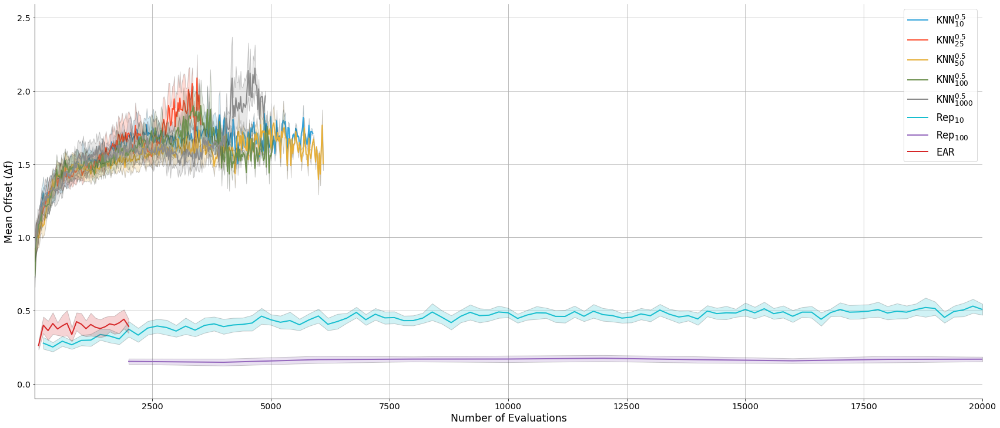

:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
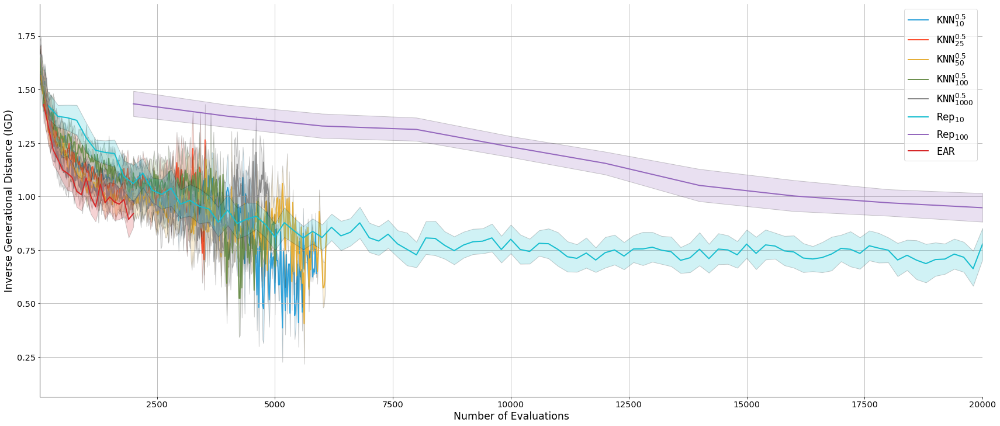

:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
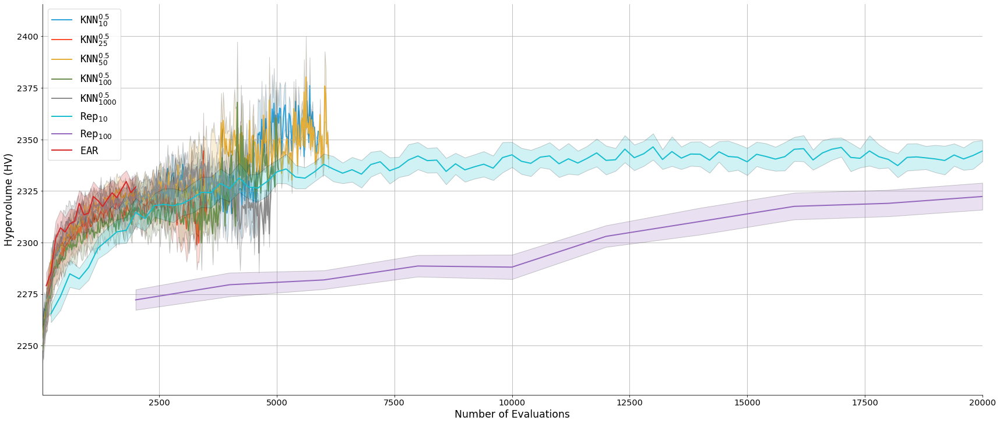

crs_8_1000 50


:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
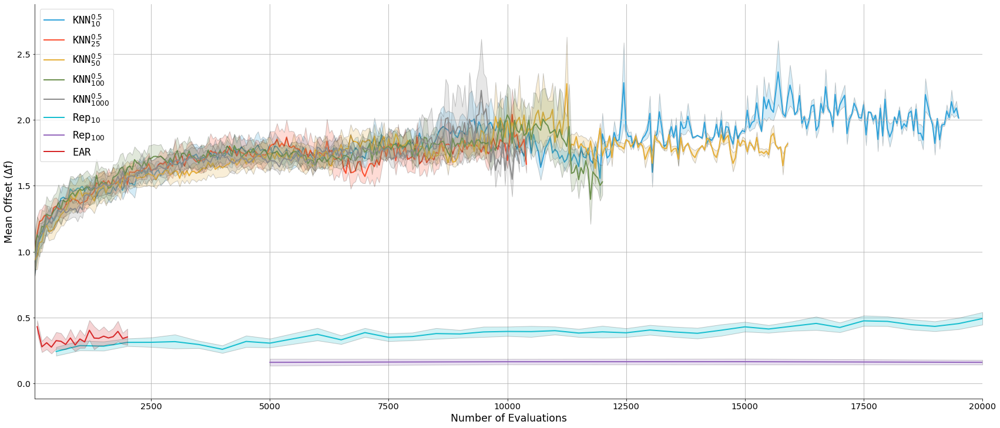

:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
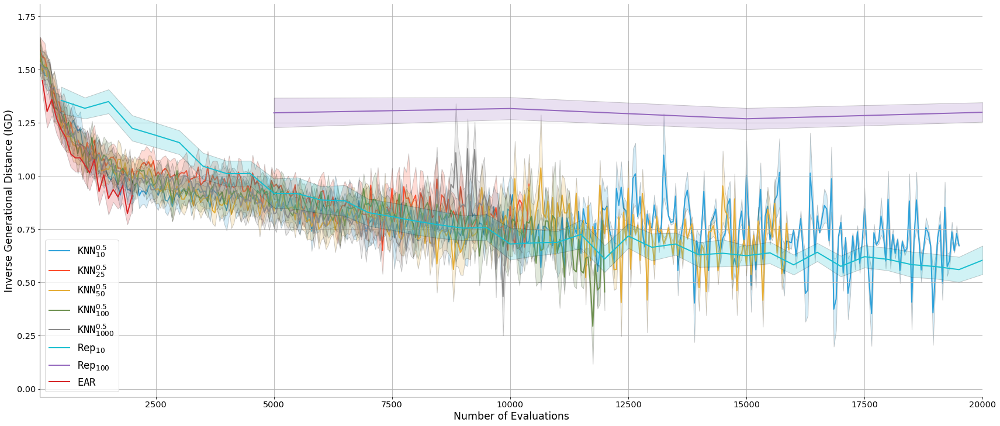

:Overlay
   .Area.I                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_10_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_25_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_50_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket  :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                      :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_1000_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_100_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VIII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                        :Curve   [n_eval]   (mean)
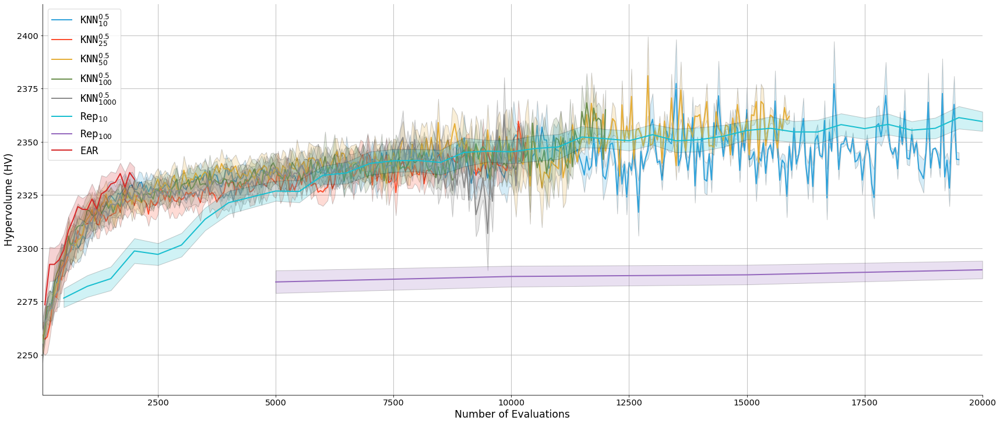

pd_5 20


AttributeError: 'DataFrame' object has no attribute 'pop_size'

In [11]:
hvplot.extension('matplotlib')

# EAR does not have PIs in the same n_eval steps. So we need to "align" them 
ac = df[df.denoiser == "EAR"]
def get_adapted_AR_df(pop_size, base_problem, granularity=50):
    new_run_dfs = []
    for n_run in ac.n_run.unique():
        run_df = ac[(ac.pop_size == pop_size) & (ac.base_problem == base_problem) & (ac.n_run == n_run)].sort_values("n_eval")
        # print(len(run_df))
        new_run_rows = []
        for n_eval in range(granularity, 20001, granularity):
            if len(run_df[run_df.n_eval <= n_eval]) == 0:
                continue
            if run_df.iloc[-1].n_eval < n_eval:# if there's nothing in the future, stop!
                break
            last_row_before_eval = run_df[run_df.n_eval <= n_eval].iloc[-1]
            last_row_before_eval["n_eval_old"] = last_row_before_eval.n_eval
            last_row_before_eval["n_eval"] = n_eval
            new_run_rows.append(last_row_before_eval)
        new_run_df = pd.DataFrame(new_run_rows)

        new_run_dfs.append(new_run_df)
    return pd.concat(new_run_dfs)

# get_adapted_AR_df(pop_size=10, base_problem="ZDT1", noise=0.1)

def area_plot(problem, pop_size, denoiser, x, perf, smoothing_on, smoothing, area, show_all_runs):
    filtered = df[(df.base_problem == problem) & (df.denoiser == denoiser)]
    
    if denoiser == "EAR" and x == "n_eval":
        filtered = get_adapted_AR_df(base_problem=problem, pop_size=pop_size, granularity=100)
    
    one = filtered[filtered.pop_size == pop_size].pivot(index=x, columns="n_run", values=perf)
    num_cols = len(one.columns)

    ylabel_dict_long = {"perf_dfp": "Mean Offset (Δf)", "perf_igd": "Inverse Generational Distance (IGD)", "perf_hv": "Hypervolume (HV)"}
    ylabel_dict = {"perf_dfp": "Δ f", "perf_gigd": "IGD", "perf_ghv": "HV"}
    plot_options = dict(width=2400, height=1000, grid=True, xlabel="Number of Evaluations", ylabel=ylabel_dict_long.get(perf, perf), legend='bottom', fontsize={'title': 'xx-large', 'legend':'xx-large', 'ylabel': 'xx-large', 'xlabel': 'xx-large', 'ticks': 'x-large'})

    all_plots = one.hvplot(**plot_options)

    one["mean"] = one.mean(axis=1)
    one["smoothened"] = one["mean"].ewm(alpha=(1 - smoothing)).mean()
    one["c95_high"] = one['mean'] + 1.96* one.sem(axis=1)
    one['c95_low'] = one['mean'] - 1.96* one.sem(axis=1)
    if area == "std":
        one["c95_high"] = one['mean'] + one.std(axis=1)
        one['c95_low'] = one['mean'] - one.std(axis=1)



    # plot = all_plots
    plot = one.hvplot.area(**plot_options, y="c95_low", y2="c95_high", alpha=0.2, hover=False, label=False) #f"{denoiser}: {'Standard Error of Means (p=0.05)' if area == 'sem' else 'Standard deviation'}") 
    
    
    meanplot = one["mean"].hvplot(**plot_options, label=f"{denoiser_to_latex.get(denoiser, denoiser)}") #: Mean of {num_cols} runs")

    plot *= meanplot
    if smoothing_on:
        plot *= one["smoothened"].hvplot(line_dash="dotted", label=f"P{pop_size}: smoothened = {round(smoothing, 2)}", line_width=3, hover=False)
    if show_all_runs:
        plot = all_plots * plot

    return plot

for problem in ["crs_8_1000", "pd_5"]:
    for pop_size in ["20", "50"]:

        print(problem, pop_size)
        
        approaches = ["k10-MD0.5", "k25-MD0.5", "k50-MD0.5", "k100-MD0.5", "k1000-MD0.5", "Rep10", "Rep100", "EAR"]

        df_plots = [
            area_plot(problem=problem, pop_size=pop_size, denoiser=denoiser, x="n_eval", perf="perf_dfp", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
            for denoiser in approaches
        ]

        igd_plots = [
            area_plot(problem=problem, pop_size=pop_size, denoiser=denoiser, x="n_eval", perf="perf_igd", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
            for denoiser in approaches
        ]

        hv_plots = [
            area_plot(problem=problem, pop_size=pop_size, denoiser=denoiser, x="n_eval", perf="perf_hv", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
            for denoiser in approaches
        ]

        display(functools.reduce(lambda a, b: a * b, df_plots)) #.save("convergence_df.png"))
        display(functools.reduce(lambda a, b: a * b, igd_plots)) #.save("convergence_igd.png"))
        display(functools.reduce(lambda a, b: a * b, hv_plots)) #.save("convergence_hv.png"))

        # Save to file
        # hv.save(functools.reduce(lambda a, b: a * b, df_plots), paper_figures / f"casestudy-convergence-{problem}-{pop_size}-df.png", fmt="png")
        # hv.save(functools.reduce(lambda a, b: a * b, igd_plots), paper_figures / f"casestudy-convergence-{problem}-{pop_size}-igd.png", fmt="png")
        # hv.save(functools.reduce(lambda a, b: a * b, hv_plots), paper_figures / f"casestudy-convergence-{problem}-{pop_size}-hv.png", fmt="png")
